# 0.0 Imports

In [1]:
import optuna
import pickle
import pandas                          as pd
import numpy                           as np
import seaborn                         as sns
import xgboost                         as xgb
from plotly     import express         as px
from matplotlib import pyplot          as plt
from sklearn    import model_selection as ms
from sklearn    import metrics         as mt
from sklearn    import linear_model    as lm
from sklearn    import ensemble        as en
from sklearn    import preprocessing   as pp
from imblearn   import over_sampling   as o_s
from boruta     import BorutaPy


import warnings
warnings.filterwarnings("ignore")

## 0.1 DEFS

In [30]:
def data_cleaning(data):
    data.replace('na', np.nan, inplace=True)
    data=data.astype(float)
    data = data.fillna(data.median())
    return data

def data_preparation(data):
    df_scaler = pickle.load(open('/home/tfmeneghello/repos/bix/features/df_scaler.pkl', 'rb'))
    df_scaled = df_scaler.fit_transform(data)
    data1 = pd.DataFrame(df_scaled, columns=data.columns)
    cols_selected = ['aa_000', 'ag_001', 'ag_002', 'ag_003', 'ag_005',
                     'ag_006', 'ag_008', 'ai_000', 'al_000', 'ay_000',
                     'ay_001', 'ay_002', 'ay_004', 'ay_005', 'ay_006',
                     'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001',
                     'az_002', 'az_003', 'az_004', 'az_007', 'ba_007',
                     'ba_008', 'ba_009', 'bk_000', 'bs_000', 'cj_000',
                     'cl_000', 'cm_000', 'cn_000', 'cn_007', 'cn_008',
                     'cn_009', 'cs_006', 'cs_007', 'dd_000', 'de_000',
                     'dg_000', 'do_000', 'ds_000', 'ec_00', 'ee_005',
                     'ee_006', 'ee_007', 'ee_008', 'ee_009']
    return data1[cols_selected]
    
def metrics(model, x_test_, y_test_, model_name):
    ypred = model.predict(x_test_)
    recall_model = mt.recall_score(y_test_, ypred, pos_label=1)
    acc_model = mt.accuracy_score(y_test_,  ypred)
    precision_model = mt.precision_score(y_test_,  ypred, pos_label=1 )
    f1score_model = mt.f1_score(y_test_,  ypred)
    dfmetric = pd.DataFrame({"Model": [model_name],
                             "Recall": [recall_model],
                             "Precision": [precision_model],
                             "Accuracy": [acc_model],
                             "F1_Score": [f1score_model]})
    return ypred, dfmetric
    
    
def df_results(dfmetric1, dfmetric2, dfmetric3):
    dfresult = pd.concat([dfmetric1, dfmetric2, dfmetric3])
    return dfresult


def confusion_matrix(y_test__, ypred__):
    confusion_matrix_model = mt.confusion_matrix(y_test__, ypred__)
    tn, fp, fn, tp = confusion_matrix_model.ravel()
    cost_ = (10*fp) + (25*tp) + (500*fn)
    disp = mt.ConfusionMatrixDisplay(confusion_matrix_model)
    disp.plot()
    plt.show()
    return cost_ , plt.show()

def cost(_y_test, _ypred):
    tn, fp, fn, tp = mt.confusion_matrix(_y_test, _ypred).ravel()
    cost_ = (10*fp) + (25*tp) + (500*fn)
    return cost_



## 0.2 Load Dataset

In [3]:
df_raw = pd.read_csv('dataset/air_system_previous_years.csv')

# 1.0 Data Description

In [35]:
df_train = df_raw.copy()
# data dimension
print('Number of rows:{}'.format(df_train.shape[0]))
print('Number of columns:{}'.format(df_train.shape[1]))

Number of rows:60000
Number of columns:171


In [5]:
df_train.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [5]:
df_train.columns

Index(['class', 'aa_000', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000',
       'ag_000', 'ag_001', 'ag_002',
       ...
       'ee_002', 'ee_003', 'ee_004', 'ee_005', 'ee_006', 'ee_007', 'ee_008',
       'ee_009', 'ef_000', 'eg_000'],
      dtype='object', length=171)

In [4]:
#data types
df_train.dtypes

class     object
aa_000     int64
ab_000    object
ac_000    object
ad_000    object
           ...  
ee_007    object
ee_008    object
ee_009    object
ef_000    object
eg_000    object
Length: 171, dtype: object

In [13]:
df_train.dtypes.value_counts()

object    169
int64       1
Name: count, dtype: int64

In [36]:
X = df_train.drop(columns=['class'])
y = df_train['class']

In [37]:
X_train, X_val, y_train, y_val = ms.train_test_split(X, y, test_size=0.20, random_state=1)

print('Number of rows train:{}'.format(X_train.shape[0]))
print('Number of columns train:{}'.format(X_train.shape[1]))
print()
print('Number of rows validation:{}'.format(X_val.shape[0]))
print('Number of columns validation:{}'.format(X_val.shape[1]))

Number of rows train:48000
Number of columns train:170

Number of rows validation:12000
Number of columns validation:170


In [38]:
df1 = X_train.copy()
df1['class'] = y_train
df1['class'] = [1 if i=='pos' else 0 for i in df1['class']]


In [39]:
df_val = X_val.copy()
df_val['class'] = y_val
df_val['class'] = [1 if i=='pos' else 0 for i in df_val['class']]

# 2.0 Exploratory Data Analysis 

In [40]:
df2 = df1.copy()

### a) check NA

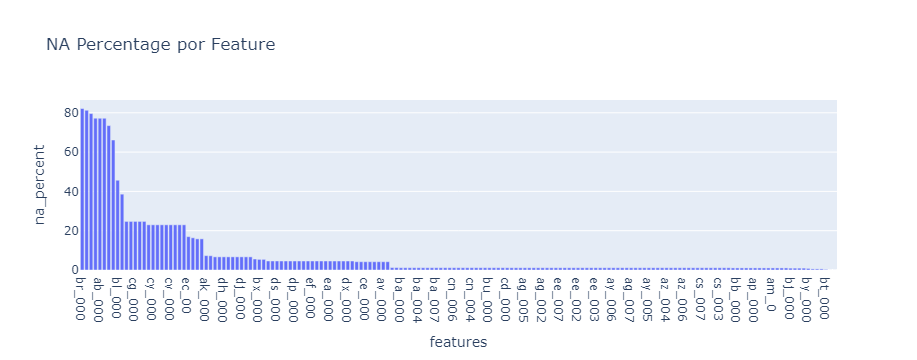

In [41]:
# check NA
df2.replace('na', np.nan, inplace=True)
df2=df2.astype(float)
check_na = df2.isna().sum()
na_percent = (check_na / df2.shape[0])*100
df_na = pd.DataFrame({'features': df2.columns,
                      'na_percent': na_percent})
df_na = df_na.sort_values('na_percent', ascending=False).reset_index()
df_na = df_na.drop('index', axis=1)
px.bar(df_na, x='features', y='na_percent', title='NA Percentage por Feature')

In [12]:
# colunas a serem removidas >50% de NA
cols_remove = na_percent[na_percent >50].index.to_list()
print(cols_remove)

['ab_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'cr_000']


In [42]:
# Fillout NA com o valor de mediana de cada coluna para não criar pesos ficticios pelo alto numero de NA
df2 = df2.fillna(df2.median())

### b) Descriptive Statistical

In [14]:
# Tendencia Central (Central Tendency) - mean, median
ct1 = pd.DataFrame(df2.apply(np.mean)).T
ct2 = pd.DataFrame(df2.apply(np.median)).T

# Dispersão (Dispersion) - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame(df2.apply(np.std)).T
d2 = pd.DataFrame(df2.apply(min)).T
d3 = pd.DataFrame(df2.apply(max)).T
d4 = pd.DataFrame(df2.apply(lambda x: x.max() - x.min())).T
d5 = pd.DataFrame(df2.apply(lambda x: x.skew())).T
d6 = pd.DataFrame(df2.apply(lambda x: x.kurtosis())).T

ds = pd.concat([d2,d3,d4,ct1,ct2,d1,d5,d6]).T.reset_index()
ds.columns = (['attributes','min','max','range','mean','median','std','skew','kurtosis'])
ds = ds.round(2)
ds.head()

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,aa_000,0.0,2.746564e+06,2.746564e+06,5.948064e+04,30746.0,1.465048e+05,6.18,49.45
1,ab_000,0.0,1.340000e+02,1.340000e+02,1.600000e-01,0.0,1.480000e+00,42.91,2856.58
2,ac_000,0.0,2.130707e+09,2.130707e+09,3.362080e+08,152.0,7.767394e+08,1.88,1.53
3,ad_000,0.0,8.584298e+09,8.584298e+09,1.792127e+05,126.0,3.918137e+07,219.09,48000.00
4,ae_000,0.0,1.204800e+04,1.204800e+04,5.800000e+00,0.0,1.050200e+02,56.15,4906.76


In [15]:
# Features com baixo desvio padrão (<0.05) que indicam comportamento igual em todas as linhas serão retiradas
aux = ds.loc[ds['std'] <= 0.05, 'attributes']
cols_remove.extend(aux.iloc[:])
print(cols_remove)

['ab_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'cr_000', 'cd_000', 'ch_000']


### c) Ocorrência das classes na variável resposta

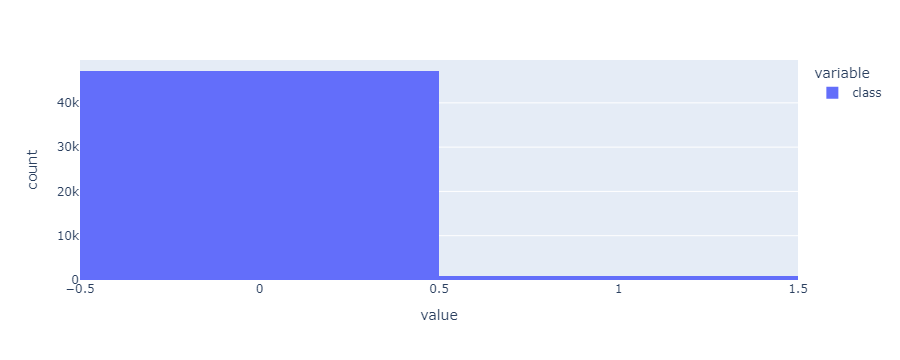

In [16]:
#response variable
px.histogram(df2['class'])

### d) Histograma das Features em relação à variável resposta

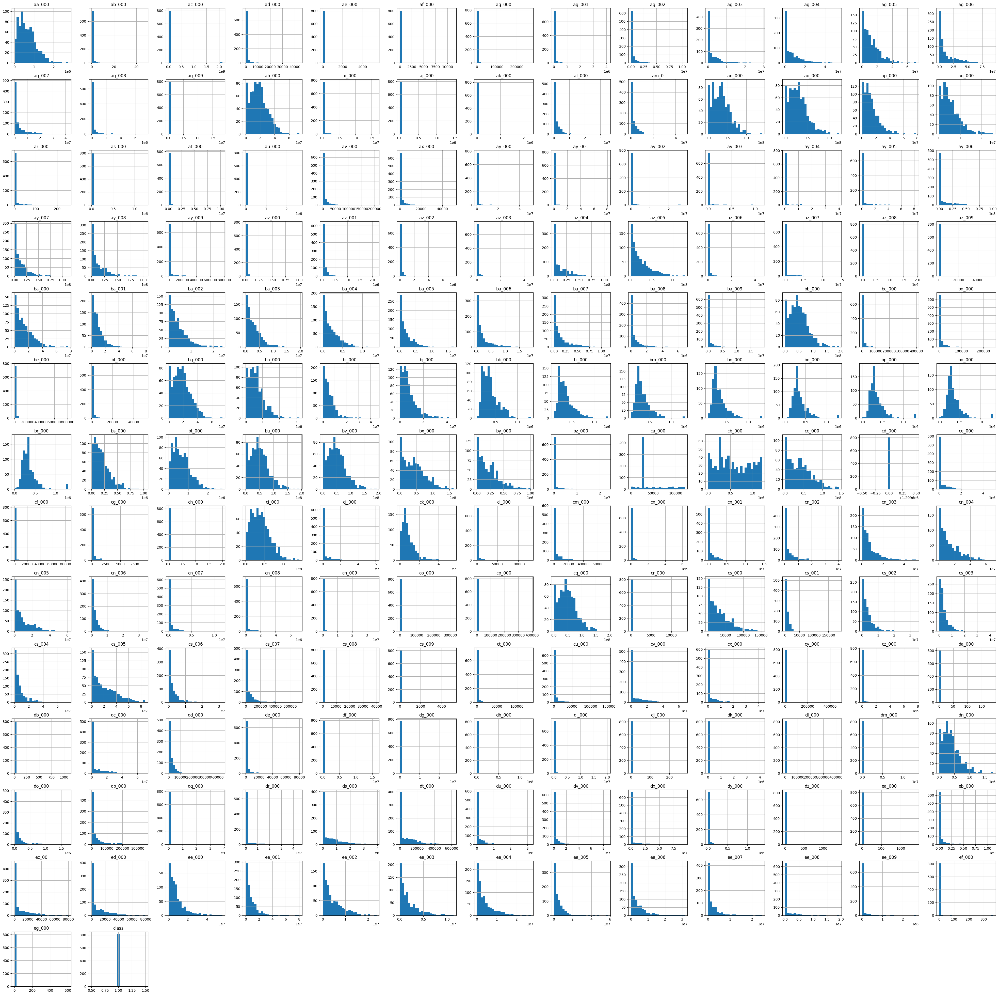

In [67]:
# classe positiva
dfaux1 = df2.loc[df2['class']==1, :]
dfaux1.hist(bins = 25, figsize=(50,50));

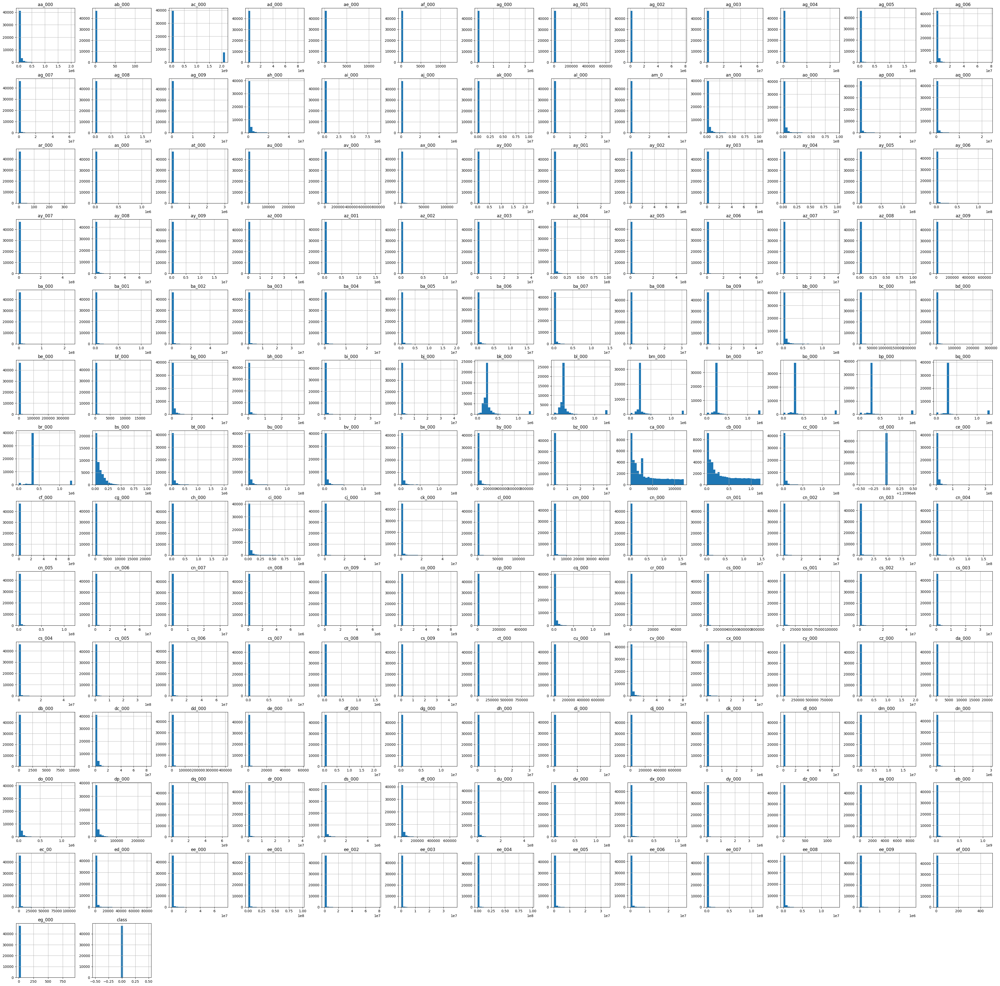

In [68]:
# classe negativa
dfaux2 = df2.loc[df1['class']==0, :]
dfaux2.hist(bins = 25, figsize=(50,50));

### e) Análise de colinearidade entre as variáveis

[]

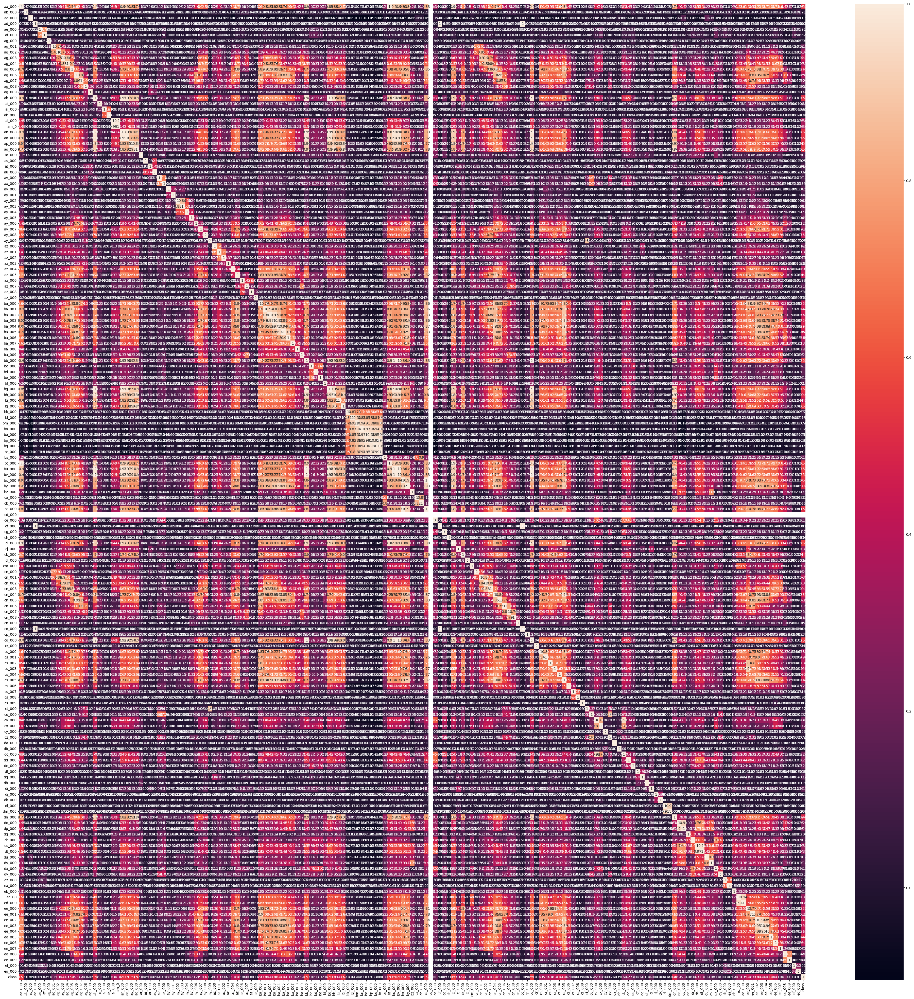

In [18]:
#análise de colinearidade para redução de dimensionalidade
correlation = df2.corr(method='pearson')
plt.figure(figsize=(50,50))
sns.heatmap(correlation, annot=True)
plt.plot()

In [19]:
#análise de colinearidade para redução de dimensionalidade acima de 0,8
threshold = 0.80
upper = correlation.where(np.triu(np.ones(correlation.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print('Features descartadas colinearidade acima de 0.80:{}'.format(to_drop))
print(len(to_drop))

Features descartadas colinearidade acima de 0.80:['ag_004', 'ag_007', 'ah_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ay_003', 'az_005', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'bb_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'cb_000', 'cc_000', 'cf_000', 'ci_000', 'ck_000', 'cn_001', 'cn_002', 'cn_003', 'cn_004', 'cn_005', 'cn_006', 'co_000', 'cq_000', 'cs_000', 'cs_001', 'cs_002', 'cs_003', 'cs_004', 'cs_005', 'ct_000', 'cx_000', 'cz_000', 'dc_000', 'dm_000', 'dn_000', 'dp_000', 'dt_000', 'dv_000', 'ed_000', 'ee_000', 'ee_001', 'ee_002', 'ee_003', 'ee_004']
68


In [20]:
cols_remove.extend(to_drop)
print(cols_remove)
print(len(cols_remove))

['ab_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'cr_000', 'cd_000', 'ch_000', 'ag_004', 'ag_007', 'ah_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ay_003', 'az_005', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'bb_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'cb_000', 'cc_000', 'cf_000', 'ci_000', 'ck_000', 'cn_001', 'cn_002', 'cn_003', 'cn_004', 'cn_005', 'cn_006', 'co_000', 'cq_000', 'cs_000', 'cs_001', 'cs_002', 'cs_003', 'cs_004', 'cs_005', 'ct_000', 'cx_000', 'cz_000', 'dc_000', 'dm_000', 'dn_000', 'dp_000', 'dt_000', 'dv_000', 'ed_000', 'ee_000', 'ee_001', 'ee_002', 'ee_003', 'ee_004']
78


# 3) Feature Engineering

In [43]:
df3 = df2.copy()

In [44]:
# retirar features identificadas como não relevantes na EDA
df3 = df3.drop(cols_remove, axis=1)
print('Numero de features restantes: {}'.format(df3.shape[1]))

Numero de features restantes: 99


# 4) Data Preparation - Rescaling Dataset

In [45]:
df4 = df3.copy()

In [49]:
df_scaler = pp.StandardScaler()
df_aux = df4.drop(columns=['class'], axis=1)
df_scaled = df_scaler.fit_transform(df_aux)
pickle.dump(df_scaler, open('features/df_scaler.pkl', 'wb'))
df4 = pd.DataFrame(df_scaled, columns=df_aux.columns)

# 5) Feature Selection 

In [50]:
df5 = df4.copy()
df5['class'] = df3['class']
x_train_n = df4.copy()
y_train_n = df3['class']

In [93]:
# Algoritmo Boruta para seleção de features
rf = en.RandomForestClassifier(n_estimators = 1000, n_jobs=-1)
boruta = BorutaPy(estimator=rf, n_estimators='auto', verbose=2, random_state=1)
boruta.fit(x_train_n.values, y_train_n.values)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	98
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	45
Tentative: 	13
Rejected: 	40
Iteration: 	9 / 100
Confirmed: 	45
Tentative: 	13
Rejected: 	40
Iteration: 	10 / 100
Confirmed: 	45
Tentative: 	13
Rejected: 	40
Iteration: 	11 / 100
Confirmed: 	45
Tentative: 	13
Rejected: 	40
Iteration: 	12 / 100
Confirmed: 	48
Tentative: 	10
Rejected: 	40
Iteration: 	13 / 100
Confirmed: 	48
Tentative: 	8
Rejected: 	42
Iteration: 	14 / 100
Confirmed: 	48
Tentative: 	8
Rejected: 	42
Iteration: 	15 / 100
Confirmed: 	48
Tentative: 	8
Rejected: 	42
Iteration: 	16 / 100
Confirmed: 	48
Tentative: 	8
R

BorutaPy(estimator=RandomForestClassifier(n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x7F6736B77740),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x7F6736B77740, verbose=2)

In [100]:
df_features = pd.DataFrame({'Features': x_train_n.columns,
                            "Rank pos.": boruta.ranking_,
                            "Keep": boruta.support_})
df_features = df_features.sort_values('Rank pos.')
df_features

,Features,Rank pos.,Keep
0,aa_000,1,True
7,ag_002,1,True
6,ag_001,1,True
13,ai_000,1,True
11,ag_008,1,True
...,...,...,...
96,ef_000,46,False
78,dk_000,47,False
77,dj_000,48,False
69,da_000,49,False


In [102]:
cols_boruta = boruta.support_.tolist()
cols_boruta_sel = df4.loc[:, cols_boruta].columns.to_list()
print(cols_boruta_sel)

['aa_000', 'ag_001', 'ag_002', 'ag_003', 'ag_005', 'ag_006', 'ag_008', 'ai_000', 'al_000', 'ay_000', 'ay_001', 'ay_002', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_007', 'ba_007', 'ba_008', 'ba_009', 'bk_000', 'bs_000', 'cj_000', 'cl_000', 'cm_000', 'cn_000', 'cn_007', 'cn_008', 'cn_009', 'cs_006', 'cs_007', 'dd_000', 'de_000', 'dg_000', 'do_000', 'ds_000', 'ec_00', 'ee_005', 'ee_006', 'ee_007', 'ee_008', 'ee_009']


In [64]:
cols_selected = ['aa_000', 'ag_001', 'ag_002', 'ag_003', 'ag_005',
                 'ag_006', 'ag_008', 'ai_000', 'al_000', 'ay_000',
                 'ay_001', 'ay_002', 'ay_004', 'ay_005', 'ay_006',
                 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001',
                 'az_002', 'az_003', 'az_004', 'az_007', 'ba_007',
                 'ba_008', 'ba_009', 'bk_000', 'bs_000', 'cj_000',
                 'cl_000', 'cm_000', 'cn_000', 'cn_007', 'cn_008',
                 'cn_009', 'cs_006', 'cs_007', 'dd_000', 'de_000',
                 'dg_000', 'do_000', 'ds_000', 'ec_00', 'ee_005',
                 'ee_006', 'ee_007', 'ee_008', 'ee_009']

In [65]:
df5 = df5.loc[:, cols_selected].reset_index()
df5 = df5.drop(columns='index', axis=1)
df5.head()

,aa_000,ag_001,ag_002,ag_003,ag_005,ag_006,ag_008,ai_000,al_000,ay_000,...,de_000,dg_000,do_000,ds_000,ec_00,ee_005,ee_006,ee_007,ee_008,ee_009
0,-0.401247,-0.028603,-0.057138,-0.099001,-0.318461,-0.411779,-0.169237,-0.056860,-0.090581,-0.025973,...,-0.136507,-0.026262,-0.466393,-0.429498,-0.279988,-0.338598,-0.305632,-0.192090,-0.301568,-0.184843
1,-0.404046,-0.028603,-0.057138,-0.113773,-0.330571,-0.419493,-0.169237,-0.056860,-0.105450,-0.025973,...,-0.223991,-0.026262,-0.466801,-0.432996,-0.382179,-0.343004,-0.306766,-0.195259,-0.301559,-0.184843
2,-0.071183,-0.028603,-0.057138,-0.112325,0.070003,-0.061676,-0.066709,-0.015717,-0.098472,-0.025973,...,-0.064106,-0.026262,-0.466801,-0.434765,0.039313,0.127742,-0.031815,-0.139153,-0.161968,-0.178580
3,-0.195315,-0.028603,-0.057138,-0.113773,-0.310947,-0.051910,0.337098,-0.045216,-0.105450,-0.025973,...,0.477392,-0.026262,-0.301664,-0.065908,-0.060204,-0.181913,-0.151776,-0.115718,-0.065524,-0.142702
4,-0.327529,-0.028603,-0.057138,-0.113773,-0.330005,-0.313103,-0.157186,-0.056860,-0.105450,-0.025973,...,-0.227008,-0.026262,-0.239360,-0.332399,-0.287142,-0.192843,-0.293188,-0.194037,-0.297780,-0.184575


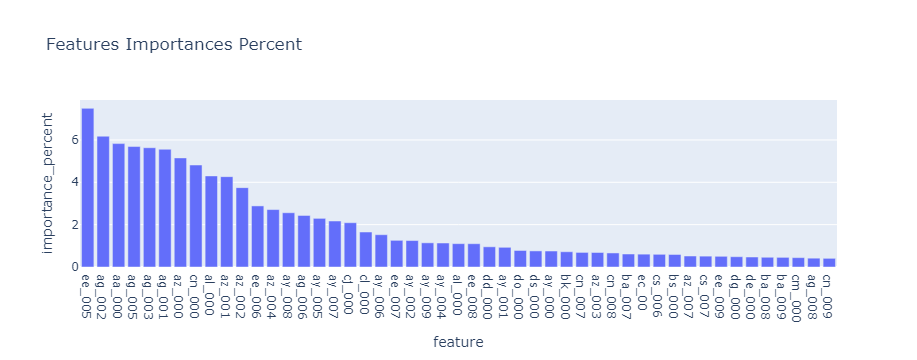

In [213]:
# Features Importances 
x_fi = df5.copy()
y_fi = df3['class']

rf.fit(x_fi, y_fi)
importances = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
indices_rf = np.argsort(importances)
selected_feature_names_rf = df5.columns[indices_rf]
importances_rf = importances[indices_rf]
importances_rf_percent = importances_rf / np.sum(importances_rf) * 100
df_rfimp = pd.DataFrame({'feature': selected_feature_names_rf,
                         'importance': importances_rf,
                         'importance_percent': importances_rf_percent})

# Ordenar o DataFrame pelo score em ordem decrescente
df_rfimp = df_rfimp.sort_values(by='importance_percent', ascending=False)

px.bar(df_rfimp, x='feature', y='importance_percent', title='Features Importances Percent')

# 6) Machine Learning

In [66]:
df6 = df5.copy()

In [67]:
x_train = df6.copy()
y_train = df3['class']

In [68]:
xval = df_val.drop('class', axis=1)
x_val = data_cleaning(xval)
x_val = data_preparation(x_val)
y_val = df_val['class']

## a) Train Model - Define Hyperparameter Fine Tunning with validation data

In [58]:
print('Dataset  de treino desbalanceado:', x_train.shape)
print('Dataset de treino desbalanceado:', y_train.value_counts())

Dataset  de treino desbalanceado: (48000, 99)
Dataset de treino desbalanceado: class
0.0    47191
1.0      809
Name: count, dtype: int64


In [69]:
# balance train dataset
smt = o_s.SMOTE()
x_train_b, y_train_b = smt.fit_resample(x_train, y_train)

In [121]:
print('Dataset balanceado:', x_train_b.shape)
print('Dataset balanceado:', y_train_b.value_counts())

Dataset balanceado: (94382, 49)
Dataset balanceado: class
0.0    47191
1.0    47191
Name: count, dtype: int64


### a) Logistic Regression

In [128]:
def obj_logistic_regression(trial):
    C = trial.suggest_int('C', 1, 82)
    max_iter = trial.suggest_int('max_iter', 100, 150)
    solver = trial.suggest_categorical("solver", ["lbfgs", 'newton-cholesky'])
    logistic_regression = lm.LogisticRegression(C = C, solver=solver, max_iter=max_iter, n_jobs=-1, random_state=42)

    logistic_regression.fit(x_train_b, y_train_b)
    ypred_logistic_regression = logistic_regression.predict(x_val)
    recall_logistic_regression = mt.recall_score(y_val,  ypred_logistic_regression, pos_label=1 )
    
    
    # recall como uma métrica intermediária
    trial.report(recall_logistic_regression, step=0)
    
    # Verificar se o trial deve ser podado
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return recall_logistic_regression

# Criar o estudo e executar a otimização com um pruner
study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner())
study.optimize(obj_logistic_regression, n_trials=100)

# melhores hiperparâmetros e a melhor score
print("Logistic_Regression")
print("Número de estudos:", len(study.trials))
print("Melhores hiperparâmetros:", study.best_params)
print("Melhor recall:", study.best_value)
#Logistic_Regression
#Número de estudos: 100
#Melhores hiperparâmetros: {'C': 49, 'max_iter': 135, 'solver': 'newton-cholesky'}
#Melhor recall: 0.9109947643979057

[I 2024-07-11 09:52:56,347] A new study created in memory with name: no-name-60eb5204-2d97-49ee-b86f-910e30c74fcf
[I 2024-07-11 09:52:59,325] Trial 0 finished with value: 0.9109947643979057 and parameters: {'C': 49, 'max_iter': 135, 'solver': 'newton-cholesky'}. Best is trial 0 with value: 0.9109947643979057.
[I 2024-07-11 09:53:00,712] Trial 1 finished with value: 0.9109947643979057 and parameters: {'C': 9, 'max_iter': 140, 'solver': 'newton-cholesky'}. Best is trial 0 with value: 0.9109947643979057.
[I 2024-07-11 09:53:02,383] Trial 2 finished with value: 0.9109947643979057 and parameters: {'C': 74, 'max_iter': 106, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.9109947643979057.
[I 2024-07-11 09:53:04,006] Trial 3 finished with value: 0.9109947643979057 and parameters: {'C': 45, 'max_iter': 111, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.9109947643979057.
[I 2024-07-11 09:53:04,780] Trial 4 finished with value: 0.9109947643979057 and parameters: {'C': 30, 'max_iter': 138, 

Logistic_Regression
Número de estudos: 100
Melhores hiperparâmetros: {'C': 49, 'max_iter': 135, 'solver': 'newton-cholesky'}
Melhor recall: 0.9109947643979057


In [70]:
model_logistic_regression = lm.LogisticRegression(C = 49, solver='newton-cholesky', max_iter=135, n_jobs=-1, random_state=42)

model_logistic_regression.fit(x_train_b, y_train_b)


LogisticRegression(C=49, max_iter=135, n_jobs=-1, random_state=42,
                   solver='newton-cholesky')

### b) XGBoost Classifier

In [168]:
def obj_xgb(trial):
    n_estimators = trial.suggest_int('n_estimators', 1500, 3500)
    max_depth = trial.suggest_int('max_depth', 5, 50)
    eta = trial.suggest_float('eta', 0.01, 0.3)
    subsample = trial.suggest_float('subsample', 0.7, 1.0)
    xgbclass = xgb.XGBClassifier(objective = 'binary:logistic',
                                 n_estimators=n_estimators, eta=eta,
                                 max_depth=max_depth, subsample=subsample,
                                 colsample_bytree=0.9)
    
    xgbclass.fit(x_train_b, y_train_b)
    ypred_xgbclass = xgbclass.predict(x_val)
    recall_xgbclass = mt.recall_score(y_val, ypred_xgbclass, pos_label=1)


    # Relatar a acurácia como uma métrica intermediária
    trial.report(recall_xgbclass, step=0)
    
    # Verificar se o trial deve ser podado
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return recall_xgbclass

# Criar o estudo e executar a otimização com um pruner
study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner())
study.optimize(obj_xgb, n_trials=100)

# Imprimir os melhores hiperparâmetros e a melhor pontuação
print("XGBoost_Classifier")
print("Número de estudos:", len(study.trials))
print("Melhores hiperparâmetros:", study.best_params)
print("Melhor recall:", study.best_value)
#XGBoost_Classifier
#Número de estudos: 100
#Melhores hiperparâmetros: {'n_estimators': 2613, 'max_depth': 50, 'eta': 0.031569960516665344, 'subsample': 0.9175025624177058}
#Melhor recall: 0.8952879581151832


[I 2024-07-11 16:40:45,813] A new study created in memory with name: no-name-988e9cae-ef8f-48f6-a9ec-36e418fe1a2f
[I 2024-07-11 16:41:24,631] Trial 0 finished with value: 0.8481675392670157 and parameters: {'n_estimators': 2701, 'max_depth': 18, 'eta': 0.16146122848352704, 'subsample': 0.7821403206068428}. Best is trial 0 with value: 0.8481675392670157.
[I 2024-07-11 16:42:29,913] Trial 1 finished with value: 0.8848167539267016 and parameters: {'n_estimators': 3060, 'max_depth': 10, 'eta': 0.033188425657557405, 'subsample': 0.9364696464193285}. Best is trial 1 with value: 0.8848167539267016.
[I 2024-07-11 16:42:55,113] Trial 2 finished with value: 0.837696335078534 and parameters: {'n_estimators': 1905, 'max_depth': 30, 'eta': 0.22833938765718836, 'subsample': 0.7065241950803318}. Best is trial 1 with value: 0.8848167539267016.
[I 2024-07-11 16:43:50,072] Trial 3 finished with value: 0.8534031413612565 and parameters: {'n_estimators': 2803, 'max_depth': 13, 'eta': 0.1379646699393544, '

XGBoost_Classifier
Número de estudos: 100
Melhores hiperparâmetros: {'n_estimators': 2613, 'max_depth': 50, 'eta': 0.031569960516665344, 'subsample': 0.9175025624177058}
Melhor recall: 0.8952879581151832


In [71]:
model_xgb = xgb.XGBClassifier(objective = 'binary:logistic',
                                n_estimators=2613, eta=0.031,
                                max_depth=50, subsample=0.9,
                                colsample_bytree=0.9)
model_xgb.fit(x_train_b, y_train_b)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.031, eval_metric=None,
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=50,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=2613,
              n_jobs=None, num_parallel_tree=None, ...)

### c) ExtraTree Classifier

In [127]:
def obj_extratrees(trial):
    n_estimators = trial.suggest_int('n_estimators', 1500, 3500)
    max_depth = trial.suggest_int('max_depth', 5, 35)
    extratrees = en.ExtraTreesClassifier(n_estimators = n_estimators,
                                         max_depth=max_depth, min_samples_leaf=2,
                                         n_jobs=-1)

    extratrees.fit(x_train_b, y_train_b)
    ypred_extratrees = extratrees.predict(x_val)
    recall_extratrees = mt.recall_score(y_val, ypred_extratrees, pos_label=1)
    

    

    # Relatar a acurácia como uma métrica intermediária
    trial.report(recall_extratrees, step=0)
    
    # Verificar se o trial deve ser podado
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return recall_extratrees

# Criar o estudo e executar a otimização com um pruner
study = optuna.create_study(direction='maximize', pruner=optuna.pruners.MedianPruner())
study.optimize(obj_extratrees, n_trials=100)

# Imprimir os melhores hiperparâmetros e a melhor pontuação
print("ExtraTrees Classifier")
print("Número de estudos:", len(study.trials))
print("Melhores hiperparâmetros:", study.best_params)
print("Melhor recall:", study.best_value)
#ExtraTrees Classifier
#Número de estudos: 100
#Melhores hiperparâmetros: {'n_estimators': 1772, 'max_depth': 14}
#Melhor recall: 0.9581151832460733

[I 2024-07-11 06:41:57,916] A new study created in memory with name: no-name-9c255a30-bd3d-4ea3-b654-fb1f4ff2aae2
[I 2024-07-11 06:43:05,192] Trial 0 finished with value: 0.9476439790575916 and parameters: {'n_estimators': 2523, 'max_depth': 11}. Best is trial 0 with value: 0.9476439790575916.
[I 2024-07-11 06:45:08,737] Trial 1 finished with value: 0.9528795811518325 and parameters: {'n_estimators': 2973, 'max_depth': 17}. Best is trial 1 with value: 0.9528795811518325.
[I 2024-07-11 06:47:02,367] Trial 2 finished with value: 0.9528795811518325 and parameters: {'n_estimators': 2688, 'max_depth': 17}. Best is trial 1 with value: 0.9528795811518325.
[I 2024-07-11 06:48:03,128] Trial 3 finished with value: 0.9424083769633508 and parameters: {'n_estimators': 3312, 'max_depth': 7}. Best is trial 1 with value: 0.9528795811518325.
[I 2024-07-11 06:48:28,101] Trial 4 finished with value: 0.9424083769633508 and parameters: {'n_estimators': 1504, 'max_depth': 7}. Best is trial 1 with value: 0.9

ExtraTrees Classifier
Número de estudos: 100
Melhores hiperparâmetros: {'n_estimators': 1772, 'max_depth': 14}
Melhor recall: 0.9581151832460733


In [72]:
model_extratrees = en.ExtraTreesClassifier(n_estimators = 1772,
                                     max_depth=14, min_samples_leaf=2,
                                     n_jobs=-1)
    
model_extratrees.fit(x_train_b, y_train_b)


ExtraTreesClassifier(max_depth=14, min_samples_leaf=2, n_estimators=1772,
                     n_jobs=-1)

# 7) Performance

## a) Machine Learning Performance

### Train - Validation Dataset 

In [221]:
ypred_logreg_train, df_train_logreg = metrics(model_logistic_regression, x_val, y_val, "Logistic_Regression")
ypred_extratrees_train, df_train_extratrees = metrics(model_extratrees, x_val, y_val, "ExtraTrees_Classifier")
ypred_xgb_train, df_train_xgb = metrics(model_xgb, x_val, y_val, "XGBoost_Classifier")
df_train = df_results(df_train_logreg, df_train_extratrees, df_train_xgb)
df_train = df_train.sort_values("Recall", ascending=False)
df_train

,Model,Recall,Precision,Accuracy,F1_Score
0,ExtraTrees_Classifier,0.958115,0.296117,0.963083,0.452410
0,Logistic_Regression,0.910995,0.371795,0.974083,0.528073
0,XGBoost_Classifier,0.884817,0.478754,0.982833,0.621324


### Test Dataset 

In [74]:
df_test = pd.read_csv('../dataset/air_system_present_year.csv')

print('Number of rows test:{}'.format(df_test.shape[0]))
print('Number of columns test:{}'.format(df_test.shape[1]))


Number of rows test:16000
Number of columns test:171


In [75]:
df_test['class'] = [1 if i=='pos' else 0 for i in df_test['class']]
y_test = df_test['class']
xtest = df_test.drop('class', axis=1)
x_test = data_cleaning(xtest)
x_test = data_preparation(x_test)

print('Number of rows test ready:{}'.format(x_test.shape[0]))
print('Number of columns test ready:{}'.format(x_test.shape[1]))

Number of rows test ready:16000
Number of columns test ready:49


In [225]:
ypred_logreg_test, df_test_logreg = metrics(model_logistic_regression, x_test, y_test, "Logistic_Regression")
ypred_extratrees_test, df_test_extratrees = metrics(model_extratrees, x_test, y_test, "ExtraTrees_Classifier")
ypred_xgb_test, df_test_xgb = metrics(model_xgb, x_test, y_test, "XGBoost_Classifier")
df_test = df_results(df_test_logreg, df_test_extratrees, df_test_xgb)
df_test = df_test.sort_values("Recall", ascending=False)
df_test

,Model,Recall,Precision,Accuracy,F1_Score
0,XGBoost_Classifier,0.952000,0.120405,0.835875,0.213772
0,ExtraTrees_Classifier,0.893333,0.471167,0.974000,0.616943
0,Logistic_Regression,0.714667,0.683673,0.985563,0.698827


## b) Business  Performance

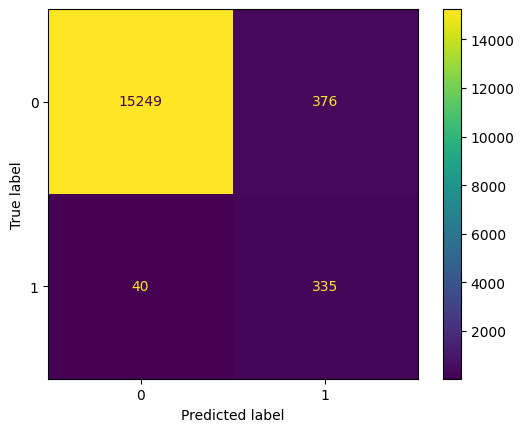

In [226]:
cost_forecast, fig = confusion_matrix(y_test, ypred_extratrees_test)

In [228]:
print('Projeção de custo: $ {:,.2f}'.format(cost_forecast))

Projeção de custo: $ 32,135.00


# 8) Conclusão

In [250]:
# cálculos considerando que a falha do sistema de ar do dataset de teste seria 1/3 corretiva (500,00) e 2/3 preventiva (25,00)
custo_teste = int(((y_test.sum()/3)*500) + ((y_test.sum()/0.66)*25))
custo_previsto = int(cost_forecast)
dif = custo_teste-cost_forecast
dif_perc = (cost_forecast*100)/custo_teste


In [253]:
tabela_final = pd.DataFrame({'Custo Atual': ["${:,.2f}".format(custo_teste)],
                             'Custo Algoritmo':["${:,.2f}".format(custo_previsto)],
                             'Economia': ["${:,.2f}".format(dif)],
                             'Redução Gasto (%)': ["{:,.2f}".format(dif_perc)]})

tabela_final

,Custo Atual,Custo Algoritmo,Economia,Redução Gasto (%)
0,"$76,704.00","$32,135.00","$44,569.00",41.89
